In [359]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,PolynomialFeatures,StandardScaler
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet,RidgeCV,Lars
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.neural_network import MLPRegressor
import seaborn as sns

# Reading and analyzing data

In [239]:
# Read Files
df = pd.read_csv('development.csv',skipinitialspace=True)
df_evaluation = pd.read_csv('evaluation.csv',skipinitialspace=True)

In [139]:
# Describe development set
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.911600e+04,3.911600e+04,39116.000000,39116.000000,39116.000000,39116.000000,39116.000000,31075.000000,39116.000000,39116.000000
mean,1.901070e+07,6.753109e+07,40.729037,-73.952308,153.406995,7.053073,23.261658,1.376466,7.204827,112.957613
std,1.100872e+07,7.863542e+07,0.054373,0.045880,242.218222,20.494289,44.601529,1.683171,33.109702,131.576326
min,2.595000e+03,2.438000e+03,40.507080,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.413194e+06,7.824647e+06,40.690260,-73.983160,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.969114e+07,3.059726e+07,40.723240,-73.955700,108.000000,3.000000,5.000000,0.720000,1.000000,46.000000
75%,2.917843e+07,1.074344e+08,40.763130,-73.936530,178.000000,5.000000,23.000000,2.020000,2.000000,226.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.716900,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [95]:
#Describe evaluation set
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12783632,NYC Mini Hotel,57230304,Imanuelly,Queens,Elmhurst,40.74037,-73.88610,Private room,75,1,2,5/26/2019,0.92,3,351
1,3463385,Gorgeous room in Manhattan,10698270,Evgenia,Manhattan,Upper East Side,40.76717,-73.95532,Private room,95,1,202,5/27/2019,3.31,2,263
2,17572926,Great 1 Bedroom on Upper East,36578169,James,Manhattan,Upper East Side,40.77984,-73.94725,Entire home/apt,130,2,0,NaN,NaN,1,0
3,33913644,"Modern and bright 2Bed 2Bath Bushwick, Brooklyn",50981314,Ofier,Brooklyn,Bushwick,40.70205,-73.91338,Entire home/apt,150,2,4,7/7/2019,1.64,1,89
4,9405895,Stylish and zen Brooklyn retreat,48775347,Mathieu,Brooklyn,Fort Greene,40.68914,-73.97853,Entire home/apt,325,3,16,4/20/2019,0.42,1,103


In [97]:
# Check columns of development set
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [98]:
# Check columns of evaluation set
df_evaluation.columns

Index(['id', 'host_id', 'host_name', 'neighbourhood',
       'neighbourhood_group_cleansed', 'latitude', 'longitude', 'room_type',
       'minimum_nights', 'availability_365', 'number_of_reviews',
       'calculated_host_listings_count', 'reviews_per_month', 'last_review'],
      dtype='object')

In [99]:
#Check null values in development set
df.isna().sum()

id                                   0
name                                13
host_id                              0
host_name                           19
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       8041
reviews_per_month                 8041
calculated_host_listings_count       0
availability_365                     0
dtype: int64

In [100]:
#Check null values in evaluation set
df_evaluation.isna().sum()

id                                   0
host_id                              0
host_name                           31
neighbourhood                     3415
neighbourhood_group_cleansed      9987
latitude                             0
longitude                            0
room_type                            0
minimum_nights                       0
availability_365                     0
number_of_reviews                    0
calculated_host_listings_count       0
reviews_per_month                 1275
last_review                       1275
dtype: int64

# Pre-Processing

In [240]:
# Find outliers in price column
column = 'price'
Q1 = df[column].quantile(0.25)
Q3 = df[column].quantile(0.75)
IQR = Q3 - Q1
mask=( (df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR)) )
df[~mask].describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.676700e+04,3.676700e+04,36767.000000,36767.000000,36767.000000,36767.000000,36767.000000,29565.000000,36767.000000,36767.000000
mean,1.890955e+07,6.630608e+07,40.728607,-73.950917,120.529959,6.972067,23.921642,1.383528,6.777409,109.661979
std,1.094512e+07,7.758473e+07,0.055139,0.046188,68.521456,20.240167,45.318447,1.696167,31.526054,130.225063
min,2.595000e+03,2.438000e+03,40.507080,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.401012e+06,7.748101e+06,40.689430,-73.982055,65.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.955460e+07,3.028359e+07,40.721910,-73.954450,100.000000,2.000000,5.000000,0.720000,1.000000,41.000000
75%,2.895851e+07,1.056267e+08,40.763390,-73.934540,160.000000,5.000000,24.000000,2.030000,2.000000,216.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.716900,341.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [241]:
#Convert null values into 0 for reviews and remove outliers
df['reviews_per_month'].fillna(0,inplace=True)
df = df[~mask]
df_evaluation['reviews_per_month'].fillna(0,inplace=True)

In [242]:
# Get same columns for development and evaluation
drop_columns = ['latitude','longitude','id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'price','last_review']
drop_columns_evaluation = ['latitude','longitude','id', 'host_id', 'host_name', 'neighbourhood',
       'neighbourhood_group_cleansed',  'last_review']
X = df.drop(drop_columns, axis=1)
X_evaluation=df_evaluation.drop(drop_columns_evaluation,axis=1)
y = df['price']

In [243]:
# Check columns of X
X.columns

Index(['room_type', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [244]:
# Match columns with X and X_evaluation
X_evaluation.columns

Index(['room_type', 'minimum_nights', 'availability_365', 'number_of_reviews',
       'calculated_host_listings_count', 'reviews_per_month'],
      dtype='object')

In [245]:
#Make sure all columns are alligned in both sets
X = X[['room_type', 'minimum_nights',
       'availability_365', 'number_of_reviews',
       'calculated_host_listings_count', 'reviews_per_month']]
X_evaluation = X_evaluation[['room_type', 'minimum_nights',
       'availability_365', 'number_of_reviews',
       'calculated_host_listings_count', 'reviews_per_month']]

In [248]:
# scale and encode columns
ss = StandardScaler()
ss_target = StandardScaler()
le = LabelEncoder()
# Transform all categorical columns in Dependant Varaible X
for i in X.columns:
    if X[i].dtype not in ['int64','float64'] :
        le.fit(X[i].append(X_evaluation[i]))
        X[[i]]=le.transform(X[[i]])
        X_evaluation[[i]] = le.transform(X_evaluation[[i]])
    else:
    # else:
        X[[i]]=ss.fit_transform(X[[i]])
        X_evaluation[[i]] = ss.fit_transform(X_evaluation[[i]])

#Convert data into numpy arrays
X = X.values
X_evaluation = X_evaluation.values
y = y.values.reshape(-1,1)


In [249]:
#Check shape of arrays
X.shape,y.shape,X_evaluation.shape

((36767, 6), (36767, 1), (9987, 6))

In [250]:
#Split the data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2,random_state=40)

In [251]:
#Check shape of splits
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((29413, 6), (7354, 6), (29413, 1), (7354, 1))

In [327]:
#define a functions for evaluating models
def evaluateModel(model):
    train_pred= model.predict(X_train)
    print("X_train")
    print("RMSE:",np.sqrt(mean_squared_error(y_train,train_pred)))
    print("r2 score:",r2_score(y_train, train_pred))

    test_pred= model.predict(X_test)
    print("X_test")
    print("RMSE:",np.sqrt(mean_squared_error(y_test,test_pred)))
    print("r2 score:",r2_score(y_test, test_pred))

def getScores(model):
    train_pred= model.predict(X_train)
    train_rmse = np.sqrt(mean_squared_error(y_train,train_pred))
    train_r2 = r2_score(y_train, train_pred)

    test_pred= model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test,test_pred))
    test_r2 = r2_score(y_test, test_pred)
    return train_rmse,train_r2,test_rmse,test_r2

# Linear Model

In [416]:
# Fit and evaluate linear Model
lr = LinearRegression()
lr.fit(X_train, y_train)
evaluateModel(lr)

X_train
RMSE: 53.09433299045722
r2 score: 0.4019065035591147
X_test
RMSE: 52.84406380396351
r2 score: 0.3957917436130046


# Polynomial Linear Regression

In [430]:
# Fit and evaluate polynomial linear regression with changing degrees
for degree in range(2,5):
    
    poly_reg = PolynomialFeatures(degree=degree)
    X_poly = poly_reg.fit_transform(X_train)
    pol_reg = LinearRegression()
    pol_reg.fit(X_poly, y_train)
    train_pred= pol_reg.predict(X_poly)
    print("\ndegree :",degree)
    print("X_train")
    print("RMSE :",np.sqrt(mean_squared_error(y_train,train_pred)))
    print("r2 score :",r2_score(y_train, train_pred))

    X_test_poly= poly_reg.transform(X_test)
    test_pred= pol_reg.predict(X_test_poly)
    print("X_test")
    print("RMSE:",np.sqrt(mean_squared_error(y_test,test_pred)))
    print("r2 score:",r2_score(y_test, test_pred))


degree : 2
X_train
RMSE : 52.59500254243814
r2 score : 0.41310325295885686
X_test
RMSE: 52.478933068746215
r2 score: 0.404112558084992

degree : 3
X_train
RMSE : 51.830206537416274
r2 score : 0.43004755583184096
X_test
RMSE: 58.56728965624353
r2 score: 0.2578281259756836


MemoryError: Unable to allocate 47.1 MiB for an array with shape (29413, 210) and data type float64

In [417]:
# Fit best polynomial Linear model
best_poly_reg = PolynomialFeatures(degree=2)
X_poly = best_poly_reg.fit_transform(X_train)
best_pol_reg = LinearRegression()
best_pol_reg.fit(X_poly, y_train)

LinearRegression()

In [418]:
#Test best polynomial linear model
train_pred= best_pol_reg.predict(X_poly)
print("X_train")
print("RMSE :",np.sqrt(mean_squared_error(y_train,train_pred)))
print("R2 score :",r2_score(y_train, train_pred))

X_test_poly= poly_reg.transform(X_test)
test_pred= pol_reg.predict(X_test_poly)
print("X_test")
print("RMSE:",np.sqrt(mean_squared_error(y_test,test_pred)))
print("r2 score:",r2_score(y_test, test_pred))

X_train
RMSE : 52.59500254243814
R2 score : 0.41310325295885686
X_test
RMSE: 52.478933068746215
r2 score: 0.404112558084992


# Ridge Regression

In [425]:
# Fit and test ridge regression
rr =Ridge()
rr.fit(X_train, y_train)
evaluateModel(rr)

X_train
RMSE: 53.09433300870764
r2 score: 0.4019065031479423
X_test
RMSE: 52.84402612771735
r2 score: 0.3957926051777385


# Lasso Regression

In [426]:
# Fit and test Lasso Regression
lr = Lasso()
lr.fit(X_train,y_train)
evaluateModel(lr)

X_train
RMSE: 53.156306303496166
r2 score: 0.40050946302483115
X_test
RMSE: 52.79757323398378
r2 score: 0.396854403365301


# Decision Tree Regression

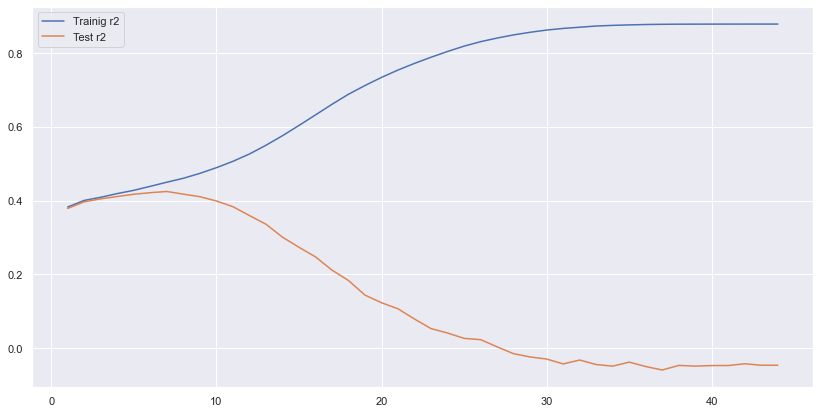

In [341]:
# Fit and test Decision Tree with max depth parameter testing

r2_train, r2_test = [],[]
for depth in range(1,45):

    treg = tree.DecisionTreeRegressor(random_state=0,max_depth=depth)
    treg.fit(X_train,y_train)
    train_rmse,train_r2,test_rmse,test_r2 = getScores(treg)
    r2_train.append(train_r2)
    r2_test.append(test_r2)

#plot results
sns.set()
plt.figure(figsize=(14,7))
sns.lineplot(y=r2_train,x=range(1,45),label='Trainig r2')
sns.lineplot(y=r2_test,x=range(1,45),label='Test r2')
plt.show()

In [ ]:
#Check best decision tree depth
np.argmax(r2_test)+1

In [343]:
# Build best tree regressor
best_treg = tree.DecisionTreeRegressor(random_state=0,max_depth=7)
best_treg.fit(X_train,y_train)
evaluateModel(best_treg)

X_train
RMSE: 50.91197889073426
r2 score: 0.45006330756368984
X_test
RMSE: 51.55712766709682
r2 score: 0.42486252398039925


# Random Forest Regression

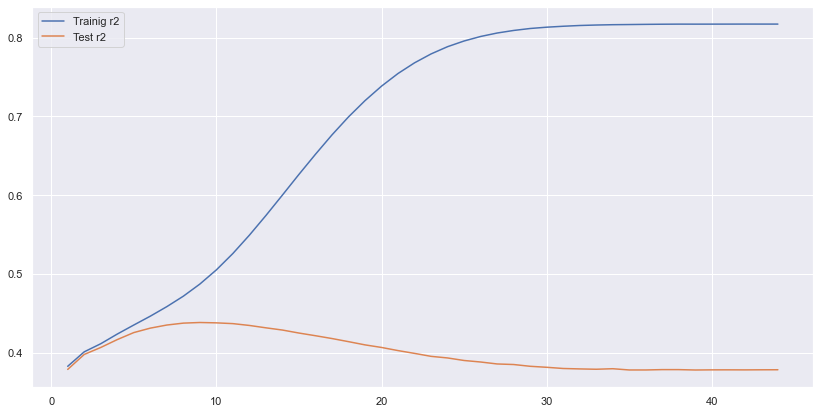

In [348]:
# Fit and test random forest with max depth parameter testing
r2_train, r2_test = [],[]
for depth in range(1,45):
    
    rfreg = RandomForestRegressor(random_state=0,max_depth=depth)
    rfreg.fit(X_train,y_train)
    train_rmse,train_r2,test_rmse,test_r2 = getScores(rfreg)
    r2_train.append(train_r2)
    r2_test.append(test_r2)

#plot results
sns.set()
plt.figure(figsize=(14,7))
sns.lineplot(y=r2_train,x=range(1,45),label='Trainig r2')
sns.lineplot(y=r2_test,x=range(1,45),label='Test r2')
plt.show()


In [350]:
#Check best random forest depth
np.argmax(r2_test)+1

8

In [354]:
# Fit and test best random forest
best_rfreg = RandomForestRegressor(random_state=0,max_depth = 9)
best_rfreg.fit(X_train,y_train)
evaluateModel(best_rfreg)

X_train
RMSE: 49.16371862449253
r2 score: 0.48718326371076914
X_test
RMSE: 50.94515263224001
r2 score: 0.43843507465139897


# Extra Tree Regression

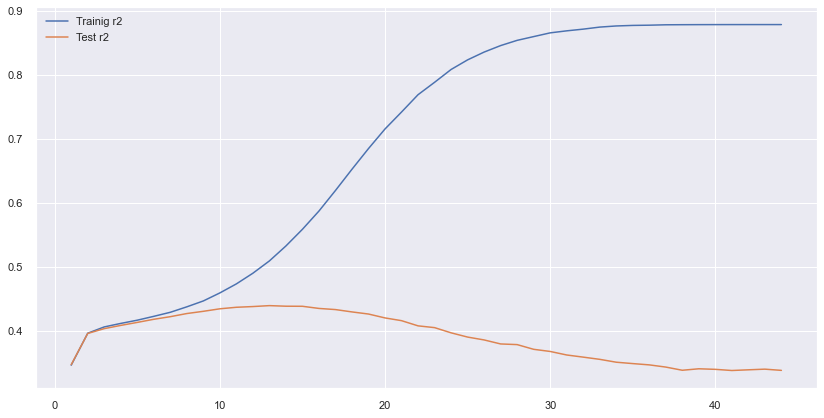

In [422]:
# Fit and test extra tree regressor with max depth parameter testing
r2_train, r2_test = [],[]
for depth in range(1,45):
    
    etreg = ExtraTreesRegressor(random_state=0,max_depth=depth)
    etreg.fit(X_train,y_train)
    train_rmse,train_r2,test_rmse,test_r2 = getScores(etreg)
    r2_train.append(train_r2)
    r2_test.append(test_r2)

#plot results
sns.set()
plt.figure(figsize=(14,7))
sns.lineplot(y=r2_train,x=range(1,45),label='Trainig r2')
sns.lineplot(y=r2_test,x=range(1,45),label='Test r2')
plt.show()


In [423]:
# best etreg regressor depth
np.argmax(r2_test)+1

13

In [368]:
# best etreg regressor
best_etreg = ExtraTreesRegressor(random_state=0,max_depth=13)
best_etreg.fit(X_train,y_train)
evaluateModel(best_etreg)

X_train
RMSE: 48.07136599851941
r2 score: 0.5097183172931199
X_test
RMSE: 50.87887193877356
r2 score: 0.43989533919746193


# MLP Regression

In [297]:
# fit and test MLP regresso with parameters
activations = ['identity', 'logistic', 'tanh', 'relu']
solvers = ['lbfgs', 'sgd', 'adam']
for activation in activations:
    for solver in solvers:
        nn = MLPRegressor(solver = solver, activation = activation,random_state=1, max_iter=500).fit(X_train, y_train)
        print("\nActivation :",activation)
        print("Solver :",solver)
        evaluateModel(nn)

Activation : identity
Solver : lbfgs
X_train
MSE: 53.0943329904865
r2 score: 0.4019065035584549
X_test
MSE: 52.84406419610132
r2 score: 0.3957917346457568
Activation : identity
Solver : sgd
X_train
MSE: 54.111539154819035
r2 score: 0.3787698630258167
X_test
MSE: 54.10731536800244
r2 score: 0.3665589397335407
Activation : identity
Solver : adam
X_train
MSE: 53.10089905340458
r2 score: 0.4017585645172589
X_test
MSE: 52.834134808596325
r2 score: 0.3960187745014928
Activation : logistic
Solver : lbfgs
X_train
MSE: 50.060733187522665
r2 score: 0.4682993962503883
X_test
MSE: 51.774514609664585
r2 score: 0.42000224693874644
Activation : logistic
Solver : sgd
X_train
MSE: 51.30463681372752
r2 score: 0.44154783793582475
X_test
MSE: 51.59855790089403
r2 score: 0.42393781560155597
Activation : logistic
Solver : adam
X_train
MSE: 51.78408633215878
r2 score: 0.43106142902486955
X_test
MSE: 51.83827605883385
r2 score: 0.41857280740498504
Activation : tanh
Solver : lbfgs
X_train
MSE: 50.4525054806689

In [298]:
# Select best mlp regressor and test it
best_nn = MLPRegressor(activation = 'relu',solver = 'lbfgs', random_state=1, max_iter=500).fit(X_train, y_train)
evaluateModel(best_nn)


# Result Computations

In [262]:
# Compute results for polynomial regression
X_evaluate_poly= poly_reg.transform(X_evaluation)
evaluate_pred_final= pol_reg.predict(X_evaluate_poly)
evaluate_pred_final

array([[168.21801923],
       [161.79855893],
       [163.71339934],
       ...,
       [ 77.40889907],
       [161.05798139],
       [ 79.77081565]])

In [369]:
# Compute results for all other regressions
evaluate_pred_final= best_etreg.predict(X_evaluation)
evaluate_pred_final

array([173.4281165 , 167.38759425, 165.2454858 , ...,  74.17913896,
       169.31272774,  71.78104869])

In [370]:
#make resultant df
result_df = pd.DataFrame(df_evaluation['id'].values,columns=['id'])
result_df['price']=evaluate_pred_final

In [371]:
#Check resultant df
result_df

,id,price
0,0,173.428117
1,1,167.387594
2,2,165.245486
3,3,160.502977
4,4,64.031138
...,...,...
9982,9982,174.616327
9983,9983,169.494526
9984,9984,74.179139
9985,9985,169.312728


In [372]:
# Convert resultant df to csv
result_df.to_csv('results_best_extratree_regressor_no_outliers.csv',index=False)

# Heatmaps

In [401]:
def scatterHeatmap(x,y,z):
    plt.figure(figsize=(20,10))
    plt.scatter(x, y,s=10, c=z,cmap='Spectral',edgecolor='k')
    plt.title("Point observations")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.style.use('seaborn')
    cbar= plt.colorbar()
    cbar.set_label("Price", labelpad=+1)
    plt.show()

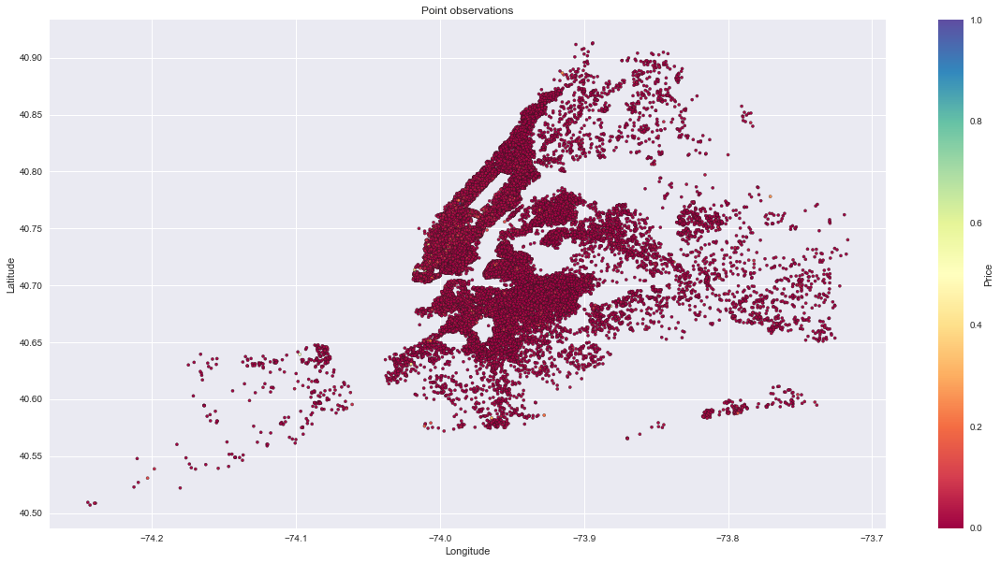

In [414]:
# Plot values from Development set
mm =MinMaxScaler()
df = pd.read_csv('development.csv',skipinitialspace=True)
x = df['longitude'].values
y = df['latitude'].values
z = mm.fit_transform(df[['price']].values)
scatterHeatmap(x,y,z)

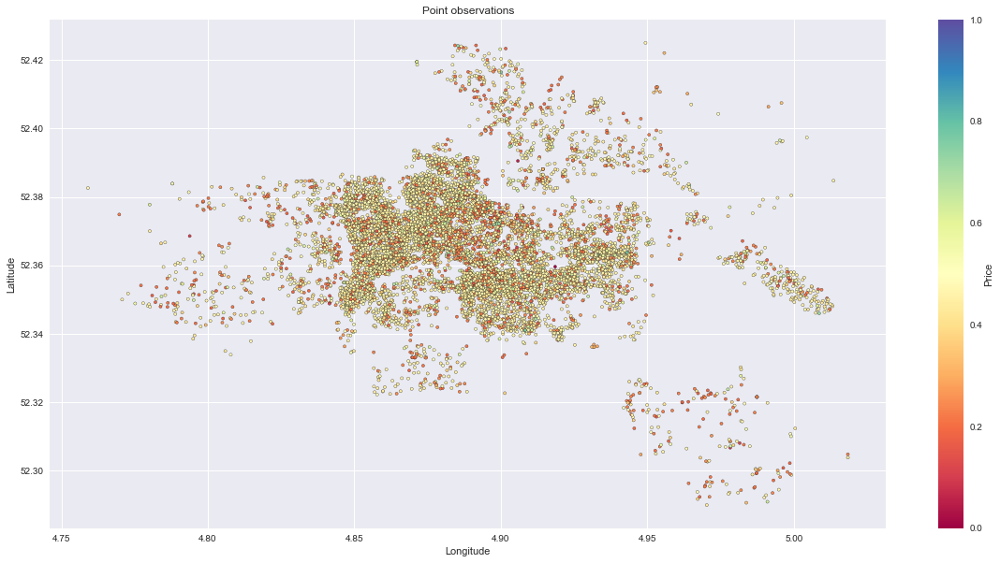

In [415]:
# plot values from evaluation set with best estimation
df_evaluation = pd.read_csv('evaluation.csv',skipinitialspace=True)
x = df_evaluation['longitude'].values
y = df_evaluation['latitude'].values
z = mm.fit_transform(best_nn.predict(X_evaluation).reshape(-1,1))
scatterHeatmap(x,y,z)